# Estimate MSV for PMI keywords v.1



There are `surprise` library for python  `fastai` implementation or own (manual) implementation based on matplotlib sampple


## Get PMI active keywords 

In [4]:
import os, sys
import json
cwd= os.getcwd()
path_to_common_dir = os.path.dirname(os.path.dirname(cwd))
sys.path.append(path_to_common_dir)

from searchlight_access_data import get_active_keywords

def get_active_keywords_cash(use_cached= False, verbose= False):
    if os.path.isfile('df_pmi.csv') and use_cached:
        print ('Using cached file for df_pmi...')
        df_pmi= pd.read_csv('df_pmi.csv')

    else: 
        print ('Loading df_pmi from DB...')
        df_pmi = get_active_keywords(accounts=['*pmi'])
        df_pmi.to_csv('df_pmi.csv')
        
    print ('len(df_pmi)={:,}'.format(len(df_pmi)))
    if verbose: 
        get_additional_info(df_pmi)
    return df_pmi

def get_additional_info(df_pmi):
    print('Country level amount= {:,}'.format(len(df_pmi[df_pmi.locode.str.len()==2])))
    print('City level amount= {:,}'.format(len(df_pmi[df_pmi.locode.str.len()>2])))
    print (df_pmi.head())


df_pmi = get_active_keywords_cash(use_cached=1, verbose= 1)
print ('len(df_pmi)= {:,}'.format(len(df_pmi)))
df_pmi

Using cached file for df_pmi...
len(df_pmi)=280,328
Country level amount= 165,879
City level amount= 114,449
   Unnamed: 0  tracked_search_id  account_id  web_property_id  rank_source_id  locale_id  device_id                       account       domain locode  location country                  rank_source   device                             phrase
0           0           24663131       17097            86819               4          2          1    PMI - Canada - ca.iqos.com  ca.iqos.com     CA    Canada      CA    Google (Canada / English)  Desktop                          vaporizer
1           1           25655344       17046            86580              26         24          1       PMI - Global - Iqos.com     iqos.com     CO  Colombia      CO  Google (Colombia / Spanish)  Desktop  el cigarrillo y sus consecuencias
2           2           25712355       17127            87022              26         24          1  PMI - Colombia - co.iqos.com  co.iqos.com     CO  Colombia      CO 

,Unnamed: 0,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi
8,8,23423708,16549,83555,5,3,1,PMI_Test,iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,imperial tobacco
9,9,24662838,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,ecigarettes


## Get all MSV from ukr vendors

In [2]:
import os, sys
import json
import pandas as pd
cwd= os.getcwd()
path_to_common_dir = os.path.dirname(os.path.dirname(cwd))
sys.path.append(path_to_common_dir)

from searchlight_access_data import get_all_tables, get_all_msv

def get_msv_ukr_cashed(use_cached= False):
    if os.path.isfile('all_msv_190730.csv') and use_cached:
        print ('Using cached file for df_all_msv.csv...')
        df_all_msv= pd.read_csv('all_msv_190730.csv')

    else: 
        print ('Loading all tables from DB...')
        all_tables= get_all_tables()
        for i in range(len(all_tables)):
            print (all_tables.iloc[i].values)
        print ('\nChoose the latest table')
        
        report= 'results_a93de1ca-a8e3-44b8-944b-477f8c3f073d_2019-07-17_07-00'
        print ('Loading df_msv from DB for {}...'.format(report))

        df_all_msv = get_all_msv(report)
        df_all_msv.to_csv('all_msv_190730.csv')
        
    print ('len(df_all_msv)={:,}'.format(len(df_all_msv)))
    return df_all_msv

df_all_msv= get_msv_ukr_cashed(use_cached= True)
df_all_msv

Using cached file for df_msv.csv...
len(df_all_msv)=7,632,915


,Unnamed: 0,Unnamed: 0.1,average_msv,competition,cpc,google_id,is_successful,locode,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,phrase
0,0,0.0,10,0.857143,0.000000e+00,2784,1,AE,10,10,10,10,10,10,10,10,10,10,10,10,0 annual fee credit card
1,1,1.0,10,0.476190,0.000000e+00,2784,1,AE,10,10,10,10,10,10,10,10,10,10,10,10,0% apr credit cards
2,2,2.0,10,0.678571,0.000000e+00,2784,1,AE,10,10,10,10,10,0,10,10,10,10,0,10,0% credit card offers
3,3,3.0,10,0.457143,2.303999e+06,2784,1,AE,10,10,10,20,10,20,10,10,10,10,10,10,0% credit cards
4,4,4.0,30,0.575092,3.734251e+06,2784,1,AE,40,30,30,40,40,40,40,30,40,20,50,30,0% interest credit cards
5,5,5.0,590,0.000000,0.000000e+00,2784,1,AE,480,590,720,880,480,480,480,390,590,590,590,480,1 aed to gbp
6,6,6.0,246000,0.002561,3.157776e+06,2784,1,AE,201000,301000,246000,165000,246000,246000,201000,201000,246000,246000,246000,368000,1 aed to inr
7,7,7.0,1300,0.009005,6.258236e+05,2784,1,AE,590,1900,1600,1000,1000,1000,880,880,1300,1300,1000,1600,1 aed to inr today rate
8,8,8.0,9900,0.000681,0.000000e+00,2784,1,AE,9900,9900,9900,9900,9900,9900,9900,8100,9900,9900,9900,9900,1 aed to php
9,9,9.0,8100,0.000745,0.000000e+00,2784,1,AE,8100,8100,8100,8100,8100,8100,8100,8100,8100,8100,8100,9900,1 eur to aed


## merge df_pmi and df_all_msv (from ukr vendors)

In [7]:
def merge_pmi_and_ukr(df_pmi,df_all_msv):
    print ('merging all pmi tracked searches and MSV from uk venddors...')
    print ('len(df_pmi)= {:,}'.format(len(df_pmi)))
    df_pmi_ukr= pd.merge(df_pmi,df_all_msv, how = 'left', left_on=(['phrase','locode']), right_on=(['phrase','locode']))
    print ('len(df_pmi_ukr)= {:,}'.format(len(df_pmi_ukr)))
    return df_pmi_ukr

df_pmi_ukr = merge_pmi_and_ukr(df_pmi,df_all_msv)
df_pmi_ukr

len(df_pmi)= 280,328
len(df_pmi_ukr)= 280,328


,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi,5185682.0,NaN,110000.0,0.144881,1.687246e+06,2840.0,1.0,110000.0,90500.0,110000.0,90500.0,110000.0,110000.0,110000.0,110000.0,110000.0,90500.0,90500.0,110000.0
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.000000,0.000000e+00,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi,1044832.0,44832.0,9900.0,0.158483,4.605651e+06,2826.0,1.0,9900.0,8100.0,8100.0,9900.0,9900.0,9900.0,9900.0,9900.0,12100.0,6600.0,9900.0,9900.0
8,8,23423708,16549,83555,5,3,1,PMI_Test,iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,imperial tobacco,943303.0,43303.0,3600.0,0.001742,0.000000e+00,2826.0,1.0,3600.0,2900.0,3600.0,3600.0,3600.0,3600.0,3600.0,3600.0,3600.0,2400.0,3600.0,3600.0
9,9,24662838,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,ecigarettes,258936.0,58936.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Coverage by urk vendors

#### NA


In [24]:
df_na= df_pmi_ukr[df_pmi_ukr['average_msv'].isnull()]
print('{:,}'.format(len(df_na)))
print('{:.2%}'.format(len(df_na)/len(df_pmi)))

21,148
7.54%


In [27]:
df_not_na= df_pmi_ukr[~df_pmi_ukr['average_msv'].isnull()]
print('{:,}'.format(len(df_not_na)))
print('{:.2%}'.format(len(df_not_na)/len(df_pmi)))

259,180
92.46%


#### Zeros


In [71]:
df_zeros= df_pmi_ukr[df_pmi_ukr['average_msv']==0]
print('{:,}'.format(len(df_zeros)))
print('{:.2%}'.format(len(df_zeros)/len(df_pmi)))
df_zeros

217,619
77.63%


,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.0,0.0,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.0,0.0,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.0,0.0,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.0,0.0,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.0,0.0,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.0,0.0,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,9,24662838,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,ecigarettes,258936.0,58936.0,0.0,0.0,0.0,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10,10,25725790,17159,87049,16,14,1,PMI - Netherlands - nl.iqos.com,nl.iqos.com,NL,Netherlands,NL,Google (Netherlands / Dutch),Desktop,luchtreiniger rook,1651361.0,51361.0,0.0,0.0,0.0,2528.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,11,25739485,17046,86580,16,14,1,PMI - Global - Iqos.com,iqos.com,NL,Netherlands,NL,Google (Netherlands / Dutch),Desktop,luchtreiniger rook,1651361.0,51361.0,0.0,0.0,0.0,2528.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12,12,23032217,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,best e juice,1189521.0,89521.0,0.0,0.0,0.0,1006886.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Values


In [26]:
df_pmi_values= df_pmi_ukr[df_pmi_ukr['average_msv']>0]
print('{:,}'.format(len(df_pmi_values)))
print('{:.2%}'.format(len(df_pmi_values)/len(df_pmi)))

41,561
14.83%


#### city level

In [29]:
print('NA: {:,}'.format(len(df_na[df_na['locode'].str.len()>2])))
print('Zeros: {:,}'.format(len(df_zeros[df_zeros['locode'].str.len()>2])))
print('Values: {:,}'.format(len(df_pmi_values[df_pmi_values['locode'].str.len()>2])))

NA: 11,609
Zeros: 84,377
Values: 18,463


#### country level

In [30]:
print('NA: {:,}'.format(len(df_na[df_na['locode'].str.len()==2])))
print('Zeros: {:,}'.format(len(df_zeros[df_zeros['locode'].str.len()==2])))
print('Values: {:,}'.format(len(df_pmi_values[df_pmi_values['locode'].str.len()==2])))

NA: 9,539
Zeros: 133,242
Values: 23,098


## Review unique locodes PMI 

In [35]:
unique_locodes_pmi = sorted(df_pmi['locode'].unique())
print (len(unique_locodes_pmi))
print (unique_locodes_pmi)

172
['AE', 'AM', 'AM EVN', 'BG', 'BG PDV', 'BG VAR', 'BR', 'CA', 'CA CAL', 'CA MTR', 'CA OTT', 'CA TOR', 'CA VAN', 'CH', 'CH BSL', 'CH GVA', 'CH LAU', 'CH LUC', 'CH ZRH', 'CN', 'CO', 'CO BAQ', 'CO BOG', 'CO CLO', 'CO CTG', 'CO MDE', 'CY', 'CZ', 'CZ BRQ', 'CZ OSR', 'CZ PRG', 'DE', 'DE BER', 'DE CGN', 'DE FRA', 'DE HAM', 'DE MUC', 'DK', 'DK AAR', 'DK ODE', 'DO', 'DO SPM', 'ES', 'ES BCN', 'ES MAD', 'ES SVQ', 'ES VLC', 'ES ZAZ', 'FR', 'FR LIO', 'FR NCE', 'FR PAR', 'GB', 'GB BEL', 'GB BHM', 'GB BRS', 'GB BSH', 'GB CDF', 'GB CMG', 'GB EDI', 'GB GLW', 'GB LCS', 'GB LIV', 'GB LON', 'GB MNC', 'GB NCS', 'GB NTG', 'GB OXF', 'GB SHE', 'GB SOU', 'GR', 'GR GPA', 'GR SKG', 'GR TRP', 'GT', 'GT GUA', 'HK', 'HR', 'HR DBV', 'HR SPU', 'HR ZAG', 'HU', 'HU BUD', 'HU DEB', 'HU MCQ', 'IL', 'IL TLV', 'IT', 'IT MIL', 'IT NAP', 'IT PMO', 'IT ROM', 'IT TRN', 'JP', 'JP NGO', 'JP OSA', 'JP TYO', 'KR', 'KR INC', 'KR PUS', 'KR SEL', 'KR TAE', 'KR TJN', 'KZ', 'KZ ALA', 'KZ AST', 'KZ SHY', 'LT', 'LT KLJ', 'LT KUN', 'LT

### Locodes content- How many keywords are presented in locode

In [41]:
df_pmi_values.groupby(['locode']).count()[['phrase']].sort_values(['phrase'], ascending=False)

,phrase
locode,
JP,4804
CH,2476
PL,1961
RU,1887
IT,1699
GB,1379
CA,1232
CO,1137
GB LON,1064


### Keywords content - How many locodes are keywords in 

In [44]:
df_pmi_values.groupby(['phrase']).count()[['locode']].sort_values(['locode'], ascending=False)

,locode
phrase,
heets,387
heatsticks,334
heated tobacco,241
tobacco heating products,230
heated tobacco products,230
heets tobacco sticks,223
tobacco heating device,223
heets near me,222
buy heets,222


## Convert input df to matrix 

In [48]:
import numpy as np 
def convert_to_matrix(df, values='topicSearchVolume', index='queryPhrase', columns='rankSourceId'):
    '''
        e.g. values='average_msv', index='phrase', columns='locode' 
    '''
    df_target=df.pivot_table(values=values, index=index, columns=columns, aggfunc=np.max, dropna= False)
    return df_target


df_target = convert_to_matrix(df_pmi_ukr, values='average_msv', index='phrase', columns='locode')
df_target



locode,AE,AM,AM EVN,BG,BG PDV,BG VAR,BR,CA,CA CAL,CA MTR,CA OTT,CA TOR,CA VAN,CH,CH BSL,CH GVA,CH LAU,CH LUC,CH ZRH,CN,CO,CO BAQ,CO BOG,CO CLO,CO CTG,CO MDE,CY,CZ,CZ BRQ,CZ OSR,CZ PRG,DE,DE BER,DE CGN,DE FRA,DE HAM,DE MUC,DK,DK AAR,DK ODE,DO,DO SPM,ES,ES BCN,ES MAD,ES SVQ,ES VLC,ES ZAZ,FR,FR LIO,FR NCE,FR PAR,GB,GB BEL,GB BHM,GB BRS,GB BSH,GB CDF,GB CMG,GB EDI,GB GLW,GB LCS,GB LIV,GB LON,GB MNC,GB NCS,GB NTG,GB OXF,GB SHE,GB SOU,GR,GR GPA,GR SKG,GR TRP,GT,GT GUA,HK,HR,HR DBV,HR SPU,HR ZAG,HU,HU BUD,HU DEB,HU MCQ,IL,IL TLV,IT,IT MIL,IT NAP,IT PMO,IT ROM,IT TRN,JP,JP NGO,JP OSA,JP TYO,KR,KR INC,KR PUS,KR SEL,KR TAE,KR TJN,KZ,KZ ALA,KZ AST,KZ SHY,LT,LT KLJ,LT KUN,LT VIL,LV,MC XXX,MD,MY,MY BKI,MY IPH,MY JHB,MY KUL,MY NTL,NL,NL AMS,NL HAG,NL MST,NL RTM,NZ,NZ AKL,NZ CHC,NZ HLZ,NZ TRG,NZ WLG,PL,PL GDN,PL GDY,PL KRK,PL LOD,PL LOZ,PL WAW,PL WRO,PL WRS,PS,PT,RO,RO CND,RS,RS INI,RS NVP,RU,SE,SI,SI CJE,SI KRJ,SI LJA,SI MBX,SI VEL,SK,SK BTS,SK KSC,SK POV,UA,UA DNK,UA KIE,UA KIV,UA LVV,UA ODS,US,ZA,ZA CPT,ZA DUR,ZA JNB,ZA PLZ,ZA PRY
phrase,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
#unsmokeyourworld,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
&lez heets,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
&lez heets zippyshare,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
0 8 mg nikotin pro zigarette,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

### Coverage by kewyrods 

In [63]:
def get_distribution_over_keywords(df_target):
    print ('Unique values of numbers of locodes presented by keywords:')
    df_n_locodes = pd.DataFrame((~pd.isnull(df_target)).sum(axis=1), columns=['n_locodes'])
    print (sorted(df_n_locodes['n_locodes'].unique()))

    print ('\nkeywords not presented in any locode: {:,}'.format(
    len(df_n_locodes[df_n_locodes['n_locodes']==0])))


    
    distribution= df_n_locodes.reset_index().groupby(['n_locodes']).count()
    print ('\ndistribution of n_locodes: \n{}'.format(distribution))
    return distribution

get_distribution_over_keywords(df_target)



Unique values of numbers of locodes presented by keywords:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 41, 42, 44, 45, 47, 50, 51, 52, 53, 54, 58, 59, 60, 61, 62, 63, 64, 66, 68, 70, 74, 75, 76, 80, 81, 82, 83, 84, 85, 87, 88, 90, 91, 92, 93, 94, 95, 96, 98, 99, 100, 103, 104, 106, 107, 111, 112, 113, 118, 138, 143, 148]

keywords not presented in any locode: 4,979

distribution of n_locodes: 
           phrase
n_locodes        
0            4979
1           30957
2            2896
3             496
4            1426
5              94
6            1174
7             254
8             129
9              11
10             10
11              3
12            111
13             76
14            125
15              6
18            173
19             37
20             11
21              3
22              3
23              2
24             19
25             14
26              9
27              3
28      

,phrase
n_locodes,
0,4979
1,30957
2,2896
3,496
4,1426
5,94
6,1174
7,254
8,129


In [ ]:
## Explanation: 
#     There is 1 phrase with values in 148 locodees, 
#     There is 129 phrases with values in 90 locodees, 



### Coverage by locodes 

In [64]:
def get_distribution_over_locodes(df_target):
    print ('Unique values of numbers of keywords presented in locodes:')
    df_n_keywords  = pd.DataFrame((~pd.isnull(df_target)).sum(axis=0), columns=['n_keywords'])
    print (sorted(df_n_keywords['n_keywords'].unique()))

    print ('\nLocodes with no keywords: {:,}'.format(
    len(df_n_keywords[df_n_keywords['n_keywords']==0])))

    
    distribution= df_n_keywords.reset_index().groupby(['n_keywords']).count()
    print ('\ndistribution of n_keywords: \n{}'.format(distribution))
    return distribution

get_distribution_over_locodes(df_target)




Unique values of numbers of keywords presented in locodes:
[0, 1, 2, 6, 13, 19, 150, 171, 208, 218, 226, 247, 293, 319, 322, 343, 366, 367, 370, 372, 373, 389, 400, 403, 430, 434, 450, 457, 465, 467, 468, 552, 697, 713, 714, 767, 771, 772, 817, 841, 842, 845, 846, 847, 892, 893, 899, 943, 982, 1057, 1112, 1193, 1329, 1394, 1545, 1606, 1769, 2279, 2411, 3094, 3116, 3555, 3602, 4197, 4328, 4366, 6042, 6846]

Locodes with no keywords: 4

distribution of n_keywords: 
            locode
n_keywords        
0                4
1               11
2                1
6                1
13               4
19               1
150              1
171              6
208              1
218              3
226              6
247              2
293              1
319             11
322              2
343              4
366              1
367              3
370              2
372              2
373              1
389              1
400              5
403              2
430             14
434              2


,locode
n_keywords,
0,4
1,11
2,1
6,1
13,4
19,1
150,1
171,6
208,1


In [60]:
## Explanation: 
#     There is 4 locodes with values for 13 phrases, 
#     There is 1 locode with values for 6846 phrases 



## Distribution for df_values 

Not sure what is the  use of this 

In [65]:
df_target = convert_to_matrix(df_pmi_values, values='average_msv', index='phrase', columns='locode')
get_distribution_over_locodes(df_target)
get_distribution_over_locodes(df_target)

Unique values of numbers of keywords presented in locodes:
[1, 4, 8, 10, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 35, 36, 37, 38, 40, 53, 74, 75, 76, 77, 79, 80, 93, 95, 97, 100, 106, 116, 121, 130, 141, 239, 244, 254, 264, 269, 322, 324, 407, 444, 551, 574, 629, 688, 1029, 1046, 1616]

Locodes with no keywords: 0

distribution of n_keywords: 
            locode
n_keywords        
1                6
4                2
8                2
10               2
13               1
14               7
15               2
16               1
17               4
18               2
19              23
20               5
21               3
22               2
23               2
24               3
25               2
26               1
27               2
28               1
30               4
31               1
32               3
35               1
36               1
37               1
38               1
40               2
53              11
74               2
75         

,locode
n_keywords,
1,6
4,2
8,2
10,2
13,1
14,7
15,2
16,1
17,4


## Load Semrush results 

In [68]:
import numpy as np 
import pandas as pd

def load_semrush():
    fn = 'smr_semrush_expand_190731.csv'
    df_smr= pd.read_csv(fn)
    print ('len(df_smr)={:,}'.format(len(df_smr)))
    print (list (df_smr))
    return df_smr

df_smr = load_semrush()
df_smr

len(df_smr)=70,512
['client', 'competition', 'costPerClick', 'iso_locale', 'numberOfResults', 'processed', 'queryPhrase', 'rankSourceId', 'status_code', 'topicSearchVolume', 'trend_1', 'trend_10', 'trend_11', 'trend_12', 'trend_2', 'trend_3', 'trend_4', 'trend_5', 'trend_6', 'trend_7', 'trend_8', 'trend_9', 'iso_2', 'locale_name']


,client,competition,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name
0,PMI,0.00,0.00,ru_RU,0.0,True,сколько стиков в пачке iqos heets,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU
1,PMI,0.00,0.00,ru_RU,0.0,True,стоимость стиков heets,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU
2,PMI,0.00,0.00,ru_RU,0.0,True,купить heets в казахстане,38,200,10.0,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,RU,GOOGLE_RU_RU
3,PMI,0.00,0.00,ru_RU,0.0,True,iqos heet цена,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU
4,PMI,0.00,0.00,ru_RU,0.0,True,устройство для heets,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU
5,PMI,0.00,0.00,ru_RU,0.0,True,heets amber label цена,38,200,20.0,0.00,1.00,0.14,0.43,0.14,0.14,0.14,0.14,0.14,0.14,0.14,0.14,RU,GOOGLE_RU_RU
6,PMI,NaN,NaN,ru_RU,NaN,True,heets from marlboro купить,38,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RU,GOOGLE_RU_RU
7,PMI,0.00,0.00,ru_RU,0.0,True,heets kz,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU
8,PMI,0.00,0.00,ru_RU,0.0,True,heets parlament,38,200,10.0,1.00,0.50,1.00,0.50,1.00,0.25,1.00,0.25,0.25,1.00,0.25,0.25,RU,GOOGLE_RU_RU
9,PMI,0.00,0.00,ru_RU,0.0,True,heets стики зеленые,38,200,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,RU,GOOGLE_RU_RU


## merge all msv sources

In [70]:
def merge_pmi_ukr_and_smr(df_pmi_ukr, df_smr):    
    df_pmi_urk_and_smr= pd.merge (df_pmi_ukr, df_smr, how='left', left_on=['phrase', 'rank_source_id'], right_on= ['queryPhrase', 'rankSourceId'])
    return df_pmi_urk_and_smr
    
    
# df_pmi = get_active_keywords_cash(use_cached=1, verbose= 1)
# df_all_msv= get_msv_ukr_cashed(use_cached= True)
# df_pmi_ukr = merge_pmi_and_ukr(df_pmi,df_all_msv)

df_pmi_ukr_and_smr =  merge_pmi_ukr_and_smr(df_pmi_ukr, df_smr)
df_pmi_ukr_and_smr

,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition_x,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,client,competition_y,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.11,0.51,en_CA,2.750000e+07,True,vaporizer,4.0,200,9900.0,1.00,0.67,0.67,0.82,1.00,1.00,1.00,0.82,1.00,0.82,0.82,0.67,CA,GOOGLE_EN_CA
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi,5185682.0,NaN,110000.0,0.144881,1.687246e+06,2840.0,1.0,110000.0,90500.0,110000.0,90500.0,110000.0,110000.0,110000.0,110000.0,110000.0,90500.0,90500.0,110000.0,NaN,0.07,7.05,en_US,1.020000e+08,True,pmi,1.0,200,110000.0,1.00,1.00,1.00,1.00,1.00,0.82,0.82,1.00,0.82,1.00,0.82,0.82,US,GOOGLE_EN_US
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.000000,0.000000e+00,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.27,0.07,en_UK,1.960000e+07,True,ecig,5.0,200,14800.0,1.00,0.82,0.82,0.82,1.00,0.82,1.00,1.00,1.00,1.00,1.00,0.82,GB,GOOGLE_EN_UK
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi,1044832.0,44832.0,9900.0,0.158483,4.605651e+06,2826.0,1.0,9900.0,8100.0,8100.0,9900.0,9900.0,9900.0,9900.0,9900.0,12100.0,6600.0,9900.0,9900.0,PMI,0.15,8.48,en_UK,1.050000e+08,True,pmi,5.0,200,9900.0,0.82,1.00,0.82,0.82,0.67,0.67,0.82,0.67,0.67,0.82,0.82,0.55,GB,GOOGLE_EN_UK
8,8,23423708,16549,83555,5,3,1,PMI_Test,iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,imperial tobacco,943303.0,43303.0,3600.0,0.001742,0.000000e+00,2826.0,1.0,

## Select single MSV value within ukr and smr 


In [85]:
def select_msv(row):
    if row['average_msv']>0:
        res= row['average_msv']
    elif row['topicSearchVolume']==0:
        res= 10
    elif row['topicSearchVolume']>0:
        res = row['topicSearchVolume']
    else:    
        res= np.NAN
    return res

df_pmi_ukr_and_smr['input_msv']= df_pmi_ukr_and_smr.apply (select_msv, axis=1)

df_pmi_ukr_and_smr[['input_msv','average_msv','topicSearchVolume']]

,input_msv,average_msv,topicSearchVolume
0,9900.0,0.0,9900.0
1,NaN,0.0,NaN
2,NaN,0.0,NaN
3,320.0,0.0,320.0
4,320.0,0.0,320.0
5,110000.0,110000.0,110000.0
6,14800.0,0.0,14800.0
7,9900.0,9900.0,9900.0
8,3600.0,3600.0,NaN
9,1600.0,0.0,1600.0


In [91]:
n_values= len(df_pmi_ukr_and_smr[df_pmi_ukr_and_smr['input_msv']>0])
n_nan= len(df_pmi_ukr_and_smr[df_pmi_ukr_and_smr['input_msv'].isnull()])
print ('n_values= {:,}, n_nan= {:,}, check total= {:,}'.format(n_values,n_nan, (n_values+n_nan)))
 


n_values= 130,984, n_nan= 149,344, check total= 280,328


### Convert input msv to matrix 
This isncludes smr and ukr 

In [93]:
df_target = convert_to_matrix(df_pmi_ukr_and_smr, values='input_msv', index='phrase', columns='locode')
df_target.shape

(43905, 172)

In [101]:
# check rows are really filled with values 
df_target.isnull().sum(axis=1).unique()


array([172, 171, 166, 170, 163, 168, 169, 137, 114, 165, 133, 167, 149,
       152, 159, 135, 145, 141, 129, 158, 147, 153, 157, 154, 151, 122,
       134, 120, 148,  68,  81, 118, 164, 160, 156, 124, 162, 123,  85,
       117, 155,  91, 127,  76, 136, 109,  73, 115, 112,  61,  66, 131,
       144,  30,  24, 138,  80, 130,  77,  78,  69, 121, 140, 108, 142,
        71, 116, 150,  93, 146, 128, 143, 161, 110, 132, 139,  94,  67,
       105, 126, 119,  83,  88])

In [100]:
# check columns are really filled with values 
df_target.isnull().sum(axis=0).unique()

array([43787, 43829, 43831, 43800, 43802, 43904, 41085, 43597, 39090,
       43751, 43752, 43755, 43756, 43905, 42810, 43856, 43810, 43792,
       40526, 43502, 43503, 43701, 43790, 43827, 43403, 43799, 43817,
       43883, 43887, 43886, 42134, 43626, 43354, 43423, 43353, 43099,
       43884, 43788, 43868, 43900, 43793, 43830, 43846, 43851, 43736,
       43783, 40563, 43630, 43632, 43633, 38831, 43894, 43299, 43795,
       43876, 43882, 43898, 43822, 43863, 43858, 43808, 43853, 43852,
       43844, 40075, 43903, 43885, 41219, 43771, 43823, 43801, 43870,
       43697, 43869, 40908, 43749, 43828, 43688, 43861, 43878, 43877,
       43653])

## Run collaborative filtering 

In [130]:
from collaborative_filtering_b import fit_collaborative_filtering


def fit_target(df_target):
    Y= df_target.fillna(0) # not sure it is necessary 
    R= df_target.applymap(lambda x: 1 if x>0 else 0)
    Y_atleast_country= Y[(Y!=0).sum(axis=1)>0]
    # Y_atleast_country.sum(axis=1)
    R_atleast_country = R[(R!=0).sum(axis=1)>0]
    df_results_pivot, J_hist = fit_collaborative_filtering(Y_atleast_country, R_atleast_country, n_features=20, max_iter=5000, verbose=1, return_J_hist= True)

    df_results_pivot_temp= pd.DataFrame(df_results_pivot.to_records())
    df_results = pd.melt(df_results_pivot_temp, 
                id_vars='phrase', 
                value_vars=list(df_results_pivot_temp.columns[1:]), 
                var_name='locode', 
                value_name='msv_pred')
    return df_results,  J_hist



In [131]:
df_pred_msv, J_hist = fit_target(df_target)

Running gradient descent with alpha= 0.0005, lambda= 1, eps= 0.01, max_iter= 3000
50: 480207.1861623728
100: 300241.9329594412
150: 236512.2852502227
200: 223737.94116760002
250: 212753.29480954778
300: 202341.82171805896
350: 192456.1948773461
400: 183062.925489807
450: 174133.89708869442
500: 165643.94691393513
550: 157570.05446016515
600: 149890.98264258416
650: 142587.04037498095
700: 135639.87886994798
750: 129032.30382377582
800: 122748.10503978118
850: 116771.90819255795
900: 111089.05280681053
950: 105685.50027266784
1000: 100547.77439699124
1050: 95662.93266985017
1100: 91018.56062217771
1150: 86602.777974441
1200: 82404.24573879913
1250: 78412.16709060193
1300: 74616.27928026766
1350: 71006.83724904894
1400: 67574.59133453704
1450: 64310.76180357515
1500: 61207.01252476574
1550: 58255.42538991004
1600: 55448.47640865733
1650: 52779.01385949947
1700: 50240.23851011673
1750: 47825.68570286788
1800: 45529.209003419215
1850: 43344.96509660196
1900: 41267.39965141837
1950: 39291.2

<IPython.core.display.Javascript object>


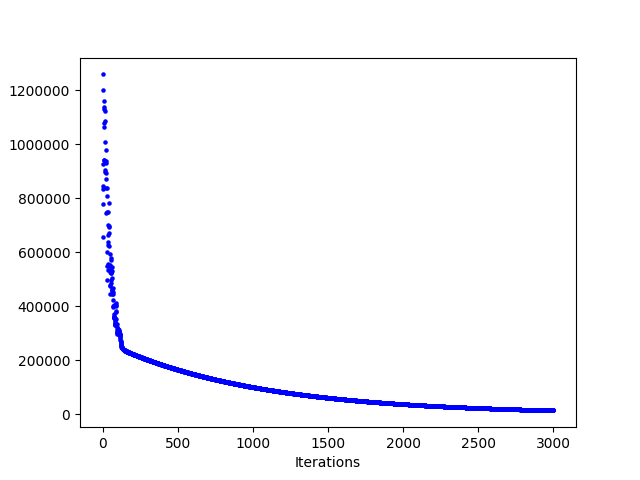

In [132]:
import matplotlib.pyplot as plt
%matplotlib notebook

def draw_cost_changes(J_hist):
    J_hist=J_hist[1:]
    plt.figure()
    plt.scatter(np.arange(0,len(J_hist)),J_hist,s=20,marker='.',c='b')
    plt.xlabel('Iterations')
    plt.ylabel('Cost')
#     plt.show()

draw_cost_changes(J_hist)

## Get unique msv values for rounding results 

In [154]:
import numpy as np 
def get_unique_msv(df_all_msv= None):
    if os.path.isfile('msv_unique_values.txt'):
        print ('Using cached values...')
        msv_unique_values= np.loadtxt('msv_unique_values.txt')
        msv_unique_values = np.vectorize(lambda x: int(x))(msv_unique_values)
    else:     
        msv_unique_values= sorted(df_all_msv.average_msv.unique())    
        np.savetxt('msv_unique_values.txt', msv_unique_values)
        print ('Values saved in "msv_unique_values.txt"')
    print ('len(msv_unique_values)= {:,}'.format(len(msv_unique_values)))
    msv_unique_values = np.array(msv_unique_values)    
    return msv_unique_values
    
msv_unique_values= get_unique_msv(df_all_msv= df_all_msv)



Using cached values...
len(msv_unique_values)= 79


array([        0,        10,        20,        30,        40,        50,
              70,        90,       110,       140,       170,       210,
             260,       320,       390,       480,       590,       720,
             880,      1000,      1300,      1600,      1900,      2400,
            2900,      3600,      4400,      5400,      6600,      8100,
            9900,     12100,     14800,     18100,     22200,     27100,
           33100,     40500,     49500,     60500,     74000,     90500,
          110000,    135000,    165000,    201000,    246000,    301000,
          368000,    450000,    550000,    673000,    823000,   1000000,
         1220000,   1500000,   1830000,   2240000,   2740000,   3350000,
         4090000,   5000000,   6120000,   7480000,   9140000,  11100000,
        13600000,  16600000,  20400000,  24900000,  30400000,  37200000,
        45500000,  55600000,  83100000, 101000000, 124000000, 151000000,
       226000000])

## Round results 

In [155]:
def round_msv(val):
    return msv_unique_values[np.argmin(np.abs(msv_unique_values-val))]

msv_unique_values= msv_unique_values[1:] # exclude 0 
df_pred_msv['pred_msv_round']= df_pred_msv['msv_pred'].apply(round_msv)



In [158]:
df_pred_msv['pred_msv_round'].isnull().any()

False

In [163]:
len(df_pred_msv), df_target.size, Y_atleast_country.size,  df_target.shape, Y_atleast_country.shape 

(5241356, 7551660, 5241356, (43905, 172), (30473, 172))

In [164]:
len(list(df_pmi['phrase'].unique()))

43905

## Select only results for input keywords 

In [166]:
df_pred_merged= pd.merge (df_pmi_ukr_and_smr, df_pred_msv, how= 'left', on = ['phrase','locode'])
df_pred_merged


280328
280328


,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition_x,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,client,competition_y,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name,input_msv,msv_pred,pred_msv_round
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.11,0.51,en_CA,2.750000e+07,True,vaporizer,4.0,200,9900.0,1.00,0.67,0.67,0.82,1.00,1.00,1.00,0.82,1.00,0.82,0.82,0.67,CA,GOOGLE_EN_CA,9900.0,10495.223203,9900.0
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi,5185682.0,NaN,110000.0,0.144881,1.687246e+06,2840.0,1.0,110000.0,90500.0,110000.0,90500.0,110000.0,110000.0,110000.0,110000.0,110000.0,90500.0,90500.0,110000.0,NaN,0.07,7.05,en_US,1.020000e+08,True,pmi,1.0,200,110000.0,1.00,1.00,1.00,1.00,1.00,0.82,0.82,1.00,0.82,1.00,0.82,0.82,US,GOOGLE_EN_US,110000.0,99959.804023,90500.0
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.000000,0.000000e+00,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.27,0.07,en_UK,1.960000e+07,True,ecig,5.0,200,14800.0,1.00,0.82,0.82,0.82,1.00,0.82,1.00,1.00,1.00,1.00,1.00,0.82,GB,GOOGLE_EN_UK,14800.0,11686.169300,12100.0
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi,1044832.0,44832.0,9900.0,0.158483,4.605651e+06,2826.0,1.0,9900.0,8100.0,8100.0,9900.0,9900.0,9900.0,9900.0,9900.0,12100.0,6600.0,9900.0,9900.0,PMI,0.15,8.48,en_UK,1.050000e+08,True,pmi,5.0,200,9900.0,0.82,1.00,0.82,0.82,0.67,0.67,0.82,0.67,0.67,0.82,0.82,0.55,GB,GOOGLE_EN

In [167]:
len(df_pred_merged[df_pred_merged['pred_msv_round']==0])

0

In [179]:
len(df_pred_merged[df_pred_merged['pred_msv_round'].isnull()]), len(df_pred_merged[df_pred_merged['pred_msv_round'].isnull()])/280328 


(73610, 0.2625852572700551)

In [180]:
len(df_pred_merged[df_pred_merged['pred_msv_round']>0]),len(df_pred_merged[df_pred_merged['pred_msv_round']>0])/280328 

(206718, 0.7374147427299449)

In [181]:
len(df_pred_merged[df_pred_merged['input_msv'].isnull()]), len(df_pred_merged[df_pred_merged['input_msv'].isnull()])/290328

(149344, 0.514397509024276)

In [172]:
len(df_pred_merged[df_pred_merged['input_msv']>0])

130984

## Override the results with input values 

In [174]:
def override_pred_by_input_msv(row): 
    if row['input_msv']>0:
         return row['input_msv']
    if row['pred_msv_round']>0:
         return row['pred_msv_round']
    return 

df_pred_merged['output_msv']=  df_pred_merged.apply(override_pred_by_input_msv, axis=1)
df_pred_merged



,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition_x,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,client,competition_y,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name,input_msv,msv_pred,pred_msv_round,output_msv
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.11,0.51,en_CA,2.750000e+07,True,vaporizer,4.0,200,9900.0,1.00,0.67,0.67,0.82,1.00,1.00,1.00,0.82,1.00,0.82,0.82,0.67,CA,GOOGLE_EN_CA,9900.0,10495.223203,9900.0,9900.0
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN,NaN
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN,NaN
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0,320.0
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0,320.0
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi,5185682.0,NaN,110000.0,0.144881,1.687246e+06,2840.0,1.0,110000.0,90500.0,110000.0,90500.0,110000.0,110000.0,110000.0,110000.0,110000.0,90500.0,90500.0,110000.0,NaN,0.07,7.05,en_US,1.020000e+08,True,pmi,1.0,200,110000.0,1.00,1.00,1.00,1.00,1.00,0.82,0.82,1.00,0.82,1.00,0.82,0.82,US,GOOGLE_EN_US,110000.0,99959.804023,90500.0,110000.0
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.000000,0.000000e+00,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.27,0.07,en_UK,1.960000e+07,True,ecig,5.0,200,14800.0,1.00,0.82,0.82,0.82,1.00,0.82,1.00,1.00,1.00,1.00,1.00,0.82,GB,GOOGLE_EN_UK,14800.0,11686.169300,12100.0,14800.0
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi,1044832.0,44832.0,9900.0,0.158483,4.605651e+06,2826.0,1.0,9900.0,8100.0,8100.0,9900.0,9900.0,9900.0,9900.0,9900.0,12100.0,6600.0,9900.0,9900.0,PMI,0.15,8.48,en_UK,1.050000e+08,True,pmi,5.0,200,9900.0,0.82,1.00,0.82,0.

In [191]:
df_pred_merged.to_csv('pred_merged_190731.csv')

In [176]:
print (list(df_pred_merged))

['Unnamed: 0_x', 'tracked_search_id', 'account_id', 'web_property_id', 'rank_source_id', 'locale_id', 'device_id', 'account', 'domain', 'locode', 'location', 'country', 'rank_source', 'device', 'phrase', 'Unnamed: 0_y', 'Unnamed: 0.1', 'average_msv', 'competition_x', 'cpc', 'google_id', 'is_successful', 'month_1', 'month_10', 'month_11', 'month_12', 'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'client', 'competition_y', 'costPerClick', 'iso_locale', 'numberOfResults', 'processed', 'queryPhrase', 'rankSourceId', 'status_code', 'topicSearchVolume', 'trend_1', 'trend_10', 'trend_11', 'trend_12', 'trend_2', 'trend_3', 'trend_4', 'trend_5', 'trend_6', 'trend_7', 'trend_8', 'trend_9', 'iso_2', 'locale_name', 'input_msv', 'msv_pred', 'pred_msv_round', 'output_msv']


In [177]:
output_cols= ['phrase','average_msv','topicSearchVolume','output_msv', 'tracked_search_id', 'account_id', 'web_property_id', 'rank_source_id', 'locale_id', 'device_id', 'account', 'domain', 'locode', 'location', 'country', 'rank_source', 'device', 'iso_locale']
df_out= df_pred_merged[output_cols]
print (len(df_out))
df_out

280328


,phrase,average_msv,topicSearchVolume,output_msv,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,iso_locale
0,vaporizer,0.0,9900.0,9900.0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,en_CA
1,el cigarrillo y sus consecuencias,0.0,NaN,NaN,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
2,el cigarrillo y sus consecuencias,0.0,NaN,NaN,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
3,efectos del tabaco,0.0,320.0,320.0,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
4,efectos del tabaco,0.0,320.0,320.0,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
5,pmi,110000.0,110000.0,110000.0,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,en_US
6,ecig,0.0,14800.0,14800.0,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,en_UK
7,pmi,9900.0,9900.0,9900.0,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,en_UK
8,imperial tobacco,3600.0,NaN,3600.0,23423708,16549,83555,5,3,1,PMI_Test,iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,NaN
9,ecigarettes,0.0,1600.0,1600.0,24662838,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,en_CA


In [178]:
df_out.to_csv('pmi_msv_190731.csv')

In [182]:
non_covered= df_out[df_out['output_msv'].isnull()]
non_covered

,phrase,average_msv,topicSearchVolume,output_msv,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,iso_locale
1,el cigarrillo y sus consecuencias,0.0,NaN,NaN,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
2,el cigarrillo y sus consecuencias,0.0,NaN,NaN,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,es_CO
12,best e juice,0.0,NaN,NaN,23032217,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,NaN
16,e juice,0.0,NaN,NaN,23031887,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,NaN
17,e-cigarette,0.0,NaN,NaN,23031813,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,NaN
18,e-liquid,0.0,NaN,NaN,23032457,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,NaN
19,electronic cigarettes,0.0,NaN,NaN,23032415,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,NaN
22,vaping,0.0,NaN,NaN,24818595,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,en_UK
23,vaping,0.0,NaN,NaN,24818930,17104,86826,5,399,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,en_UK
25,e-cigarette,NaN,NaN,NaN,26119206,17156,87036,59,577,1,PMI - Malaysia - my.iqos.com,my.iqos.com,MY,Malaysia,MY,Google (Malaysia / English),Desktop,en_MY


In [189]:
non_covered[non_covered['phrase']=='5 faits sur le tabac sans fumée']

,phrase,average_msv,topicSearchVolume,output_msv,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,iso_locale
9866,5 faits sur le tabac sans fumée,0.0,NaN,NaN,23429665,16549,83555,8,6,1,PMI_Test,iqos.com,FR,France,FR,Google (France / French),Desktop,NaN
10282,5 faits sur le tabac sans fumée,0.0,NaN,NaN,23430081,16549,83555,8,417,1,PMI_Test,iqos.com,FR PAR,Paris,FR,Google (France / French),Desktop,NaN
10698,5 faits sur le tabac sans fumée,0.0,NaN,NaN,23430497,16549,83555,8,424,1,PMI_Test,iqos.com,FR LIO,Lyon,FR,Google (France / French),Desktop,NaN
11114,5 faits sur le tabac sans fumée,0.0,NaN,NaN,23430913,16549,83555,8,419,1,PMI_Test,iqos.com,FR NCE,Nice,FR,Google (France / French),Desktop,NaN


In [188]:
non_covered.groupby ('phrase').count()

,average_msv,topicSearchVolume,output_msv,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,iso_locale
phrase,,,,,,,,,,,,,,,,,
#unsmokeyourworld,4,0,0,4,4,4,4,4,4,4,4,4,4,4,4,4,4
&lez heets,3,0,0,3,3,3,3,3,3,3,3,3,3,3,3,3,3
&lez heets zippyshare,3,0,0,3,3,3,3,3,3,3,3,3,3,3,3,3,3
1 box of heets,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,0
1 cigar a day,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,0
1 cigaret om dagen,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,0
1 kopf shisha wie viele zigaretten,2,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1 shisha wie viele zigaretten,2,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1 stange zigaretten hat wie viele zigaretten,2,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2


In [190]:
non_covered.to_csv('pmi_non_predicted.csv')

## prepare format for Arkadiy

In [192]:
df_pred_merged

,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition_x,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,client,competition_y,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name,input_msv,msv_pred,pred_msv_round,output_msv
0,0,24663131,17097,86819,4,2,1,PMI - Canada - ca.iqos.com,ca.iqos.com,CA,Canada,CA,Google (Canada / English),Desktop,vaporizer,362122.0,62122.0,0.0,0.000000,0.000000e+00,2124.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.11,0.51,en_CA,2.750000e+07,True,vaporizer,4.0,200,9900.0,1.00,0.67,0.67,0.82,1.00,1.00,1.00,0.82,1.00,0.82,0.82,0.67,CA,GOOGLE_EN_CA,9900.0,10495.223203,9900.0,9900.0
1,1,25655344,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN,NaN
2,2,25712355,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,el cigarrillo y sus consecuencias,482423.0,82423.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,es_CO,NaN,True,el cigarrillo y sus consecuencias,26.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CO,GOOGLE_ES_CO,NaN,NaN,NaN,NaN
3,3,25656125,17046,86580,26,24,1,PMI - Global - Iqos.com,iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0,320.0
4,4,25713126,17127,87022,26,24,1,PMI - Colombia - co.iqos.com,co.iqos.com,CO,Colombia,CO,Google (Colombia / Spanish),Desktop,efectos del tabaco,482371.0,82371.0,0.0,0.000000,0.000000e+00,2170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.00,0.00,es_CO,2.080000e+07,True,efectos del tabaco,26.0,200,320.0,0.81,0.81,1.00,1.00,0.67,0.19,0.15,0.44,0.81,0.67,1.00,0.44,CO,GOOGLE_ES_CO,320.0,355.486302,390.0,320.0
5,5,25969867,17548,89220,1,1,1,PMI - Global - PMIScienceUSA.com,pmiscienceusa.com,US,United States,US,Google (US / English),Desktop,pmi,5185682.0,NaN,110000.0,0.144881,1.687246e+06,2840.0,1.0,110000.0,90500.0,110000.0,90500.0,110000.0,110000.0,110000.0,110000.0,110000.0,90500.0,90500.0,110000.0,NaN,0.07,7.05,en_US,1.020000e+08,True,pmi,1.0,200,110000.0,1.00,1.00,1.00,1.00,1.00,0.82,0.82,1.00,0.82,1.00,0.82,0.82,US,GOOGLE_EN_US,110000.0,99959.804023,90500.0,110000.0
6,6,24645256,17104,86826,5,3,1,PMI - United Kingdom - uk.iqos.com,uk.iqos.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,ecig,864457.0,64457.0,0.0,0.000000,0.000000e+00,2826.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,0.27,0.07,en_UK,1.960000e+07,True,ecig,5.0,200,14800.0,1.00,0.82,0.82,0.82,1.00,0.82,1.00,1.00,1.00,1.00,1.00,0.82,GB,GOOGLE_EN_UK,14800.0,11686.169300,12100.0,14800.0
7,7,24539882,17109,86895,5,3,1,PMI - Global - Missionwinnow.com,missionwinnow.com,GB,United Kingdom,GB,Google (United Kingdom / English),Desktop,pmi,1044832.0,44832.0,9900.0,0.158483,4.605651e+06,2826.0,1.0,9900.0,8100.0,8100.0,9900.0,9900.0,9900.0,9900.0,9900.0,12100.0,6600.0,9900.0,9900.0,PMI,0.15,8.48,en_UK,1.050000e+08,True,pmi,5.0,200,9900.0,0.82,1.00,0.82,0.

In [199]:
requested_cols= [
        'locale_id',
        'country',
        'locode',
        'iso_locale',# clear
        'rankSourceName', #  use rank_source
        'rankSourceId', # use rank_source_id
        'queryPhrase', # use phrase
        'competition', # clean
        'costPerClick', # clean
        'numberOfResults', # clean
        'topicSearchVolume', # use pred_msv_round
        'trend_1',  # clean
        'trend_2', # clean
        'trend_3', # clean
        'trend_4', # clean
        'trend_5', # clean
        'trend_6', # clean
        'trend_7', # clean
        'trend_8', # clean
        'trend_9', # clean
        'trend_10', # clean
        'trend_11', # clean
        'trend_12', # clean
        'status_code',  # clean
        'processed', # clean
        'extrapolated',  # clean
        'approximated',  # clean
    ]

keep_cols= [
        'locale_id',
        'country',
        'locode',     
        'rank_source',
        'rank_source_id',
        'phrase',
        'pred_msv_round'
    ]
cols_to_rename= {
    'pred_msv_round': 'topicSearchVolume', 
    'rank_source': 'rankSourceName', 
    'rank_source_id': 'rankSourceId',
    'phrase': 'queryPhrase'} 

df_out_new= df_pred_merged[keep_cols].copy()
df_out_new.rename(columns = cols_to_rename, inplace=True)
for col in requested_cols:
    if col not in keep_cols and col not in cols_to_rename.values():
        df_out_new[col]= None
df_out_new= df_out_new [requested_cols]
df_out_new

,locale_id,country,locode,iso_locale,rankSourceName,rankSourceId,queryPhrase,competition,costPerClick,numberOfResults,topicSearchVolume,trend_1,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,trend_10,trend_11,trend_12,status_code,processed,extrapolated,approximated
0,2,CA,CA,None,Google (Canada / English),4,vaporizer,None,None,None,9900.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,24,CO,CO,None,Google (Colombia / Spanish),26,el cigarrillo y sus consecuencias,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,24,CO,CO,None,Google (Colombia / Spanish),26,el cigarrillo y sus consecuencias,None,None,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,24,CO,CO,None,Google (Colombia / Spanish),26,efectos del tabaco,None,None,None,390.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,24,CO,CO,None,Google (Colombia / Spanish),26,efectos del tabaco,None,None,None,390.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
5,1,US,US,None,Google (US / English),1,pmi,None,None,None,90500.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
6,3,GB,GB,None,Google (United Kingdom / English),5,ecig,None,None,None,12100.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
7,3,GB,GB,None,Google (United Kingdom / English),5,pmi,None,None,None,33100.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
8,3,GB,GB,None,Google (United Kingdom / English),5,imperial tobacco,None,None,None,2400.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
9,2,CA,CA,None,Google (Canada / English),4,ecigarettes,None,None,None,720.0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [201]:
df_out_new.to_csv('pmi_msv_cofi_190731.csv', index=False)

## Some investigation of zeros 

In [74]:
df_pmi_ukr_and_smr[df_pmi_ukr_and_smr['phrase']=='ecigarette']

,Unnamed: 0_x,tracked_search_id,account_id,web_property_id,rank_source_id,locale_id,device_id,account,domain,locode,location,country,rank_source,device,phrase,Unnamed: 0_y,Unnamed: 0.1,average_msv,competition_x,cpc,google_id,is_successful,month_1,month_10,month_11,month_12,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,client,competition_y,costPerClick,iso_locale,numberOfResults,processed,queryPhrase,rankSourceId,status_code,topicSearchVolume,trend_1,trend_10,trend_11,trend_12,trend_2,trend_3,trend_4,trend_5,trend_6,trend_7,trend_8,trend_9,iso_2,locale_name
2180,2180,23032319,16549,83555,5,399,1,PMI_Test,iqos.com,GB LON,London,GB,Google (United Kingdom / English),Desktop,ecigarette,1201407.0,1407.0,0.0,0.0,0.0,1006886.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15113,15113,24791822,17136,87030,15,13,1,PMI - Italy - it.iqos.com,it.iqos.com,IT,Italy,IT,Google (Italy / Italian),Desktop,ecigarette,1397076.0,97076.0,0.0,0.0,0.0,2380.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
15406,15406,24792584,17136,87030,15,382,1,PMI - Italy - it.iqos.com,it.iqos.com,IT ROM,Rome,IT,Google (Italy / Italian),Desktop,ecigarette,1425974.0,25974.0,0.0,0.0,0.0,1008736.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
32789,32789,24742692,17160,87050,126,12,1,PMI - Switzerland - ch.iqos.com,ch.iqos.com,CH,Switzerland,CH,Google (Switzerland / French),Desktop,ecigarette,451589.0,51589.0,0.0,0.0,0.0,2756.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,fr_CH,NaN,True,ecigarette,126.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CH,GOOGLE_FR_CH
42525,42525,24792586,17136,87030,15,384,1,PMI - Italy - it.iqos.com,it.iqos.com,IT MIL,Milan,IT,Google (Italy / Italian),Desktop,ecigarette,1420317.0,20317.0,0.0,0.0,0.0,1008463.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
42526,42526,24792588,17136,87030,15,383,1,PMI - Italy - it.iqos.com,it.iqos.com,IT NAP,Naples,IT,Google (Italy / Italian),Desktop,ecigarette,1422929.0,22929.0,0.0,0.0,0.0,1008560.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
42527,42527,24792590,17136,87030,15,672,1,PMI - Italy - it.iqos.com,it.iqos.com,IT TRN,Turin,IT,Google (Italy / Italian),Desktop,ecigarette,1429630.0,29630.0,0.0,0.0,0.0,1008857.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
42528,42528,24792592,17136,87030,15,671,1,PMI - Italy - it.iqos.com,it.iqos.com,IT PMO,Palermo,IT,Google (Italy / Italian),Desktop,ecigarette,1424189.0,24189.0,0.0,0.0,0.0,1008588.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,it_IT,NaN,True,ecigarette,15.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,IT,GOOGLE_IT_IT
188358,188358,24746922,17160,87050,126,12,2,PMI - Switzerland - ch.iqos.com,ch.iqos.com,CH,Switzerland,CH,Google (Switzerland / French),Smartphone,ecigarette,451589.0,51589.0,0.0,0.0,0.0,2756.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PMI,NaN,NaN,fr_CH,NaN,True,ecigarette,126.0,200 ERROR 50 :: NOTHING FOUND\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CH,GOOGLE_FR_CH
200698,200698,24792128,17136,87030,15,13,2,PMI - Italy - it.iqos.com,it.iqos.com,IT,It

In [77]:
df_all_msv[df_all_msv['average_msv']==10][['phrase']].head(20)

,phrase
0,0 annual fee credit card
1,0% apr credit cards
2,0% credit card offers
3,0% credit cards
11,12v solar battery
13,2010 maserati
14,2010 maserati quattroporte
15,2011 maserati granturismo
16,2012 maserati
17,2014 maserati


In [83]:
# what about zeros from ukr agains zeros from semrush 

print (len(df_pmi_ukr_and_smr[(df_pmi_ukr_and_smr['average_msv']==0)]))
df_pmi_ukr_and_smr[(df_pmi_ukr_and_smr['average_msv']==0)].groupby(['topicSearchVolume']).count()[['average_msv']]


217619


,average_msv
topicSearchVolume,
0.0,24175
10.0,14849
20.0,5554
30.0,5497
40.0,4344
50.0,4215
70.0,4035
90.0,2789
110.0,2788


In [210]:
from sklearn.metrics import r2_score

In [226]:
# y_true = [3, -0.5, 2, 7]
# y_pred = [2.5, 0.0, 2, 8]
y_true = [1, 2, 3, 9]
y_pred = [2, 1, 4, 8]

r2_score(y_true, y_pred)


0.896774193548387